In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import cv2
from collections import Counter
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAvgPool2D, Dense,Flatten,Dropout,BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint,ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Precision, Recall

In [ ]:
train_dir='/content/Extracted_data/new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/train'
test_dir = '/content/Extracted_data/new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid'

In [ ]:
train=ImageDataGenerator( rescale=1/255.0, validation_split=0.1,).flow_from_directory(train_dir, batch_size=16, target_size=(128,128), subset='training',  color_mode='rgb',   class_mode='categorical', shuffle=True)
valid=ImageDataGenerator( rescale=1/255.0, validation_split=0.1,).flow_from_directory(train_dir, batch_size=16, target_size=(128,128), subset='validation',  color_mode='rgb',   class_mode='categorical', shuffle=True)
test=ImageDataGenerator( rescale=1/255.0, validation_split=0.1,).flow_from_directory(test_dir, batch_size=16, target_size=(128,128),  color_mode='rgb',   class_mode='categorical', shuffle=True)

Found 63282 images belonging to 38 classes.
Found 7013 images belonging to 38 classes.
Found 17572 images belonging to 38 classes.


In [ ]:
def show_image(data,main_title='image'):
    classes=list(data.class_indices.keys())
    plt.figure(figsize=(20,20))
    plt.suptitle(main_title, fontsize=24)
    for X_batch, y_batch in data:
        for i in range(0,16):
            plt.subplot(4,4,i+1)
            plt.imshow(X_batch[i])
            plt.title(classes[np.where(y_batch[i]==1)[0][0]])
            plt.grid(False)
        plt.show()
        break


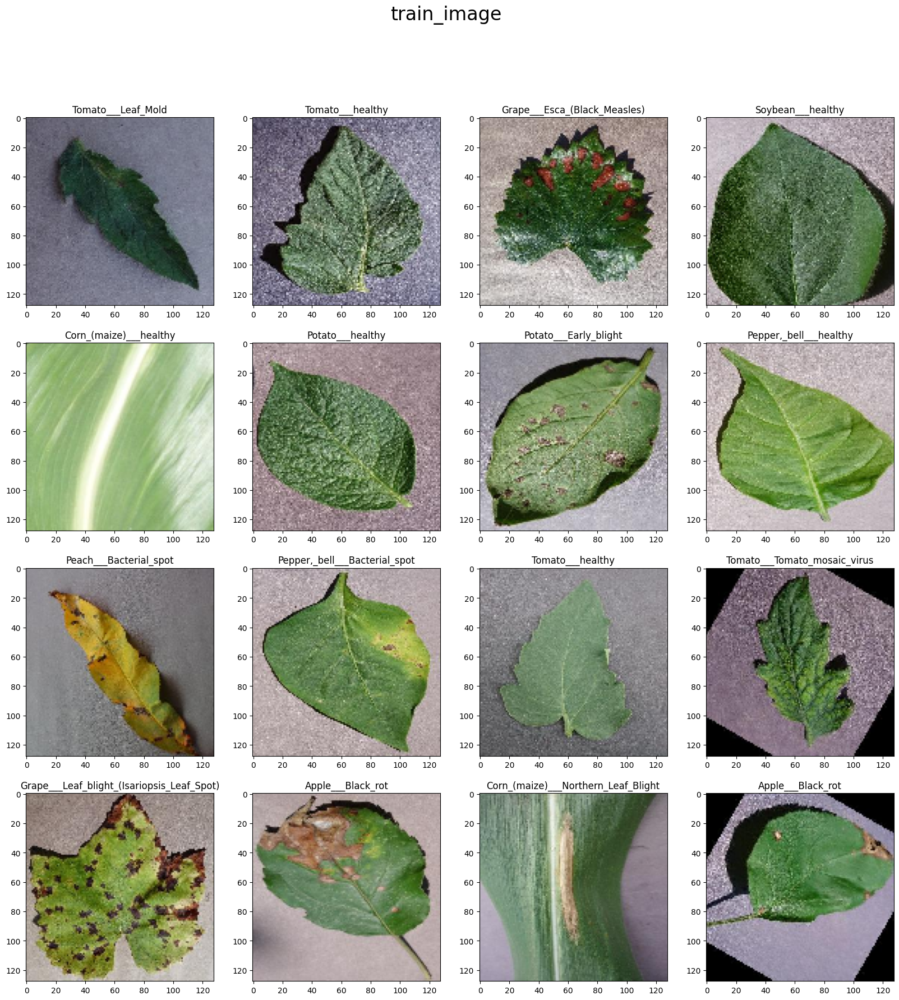

In [ ]:
show_image(train,'train_image')

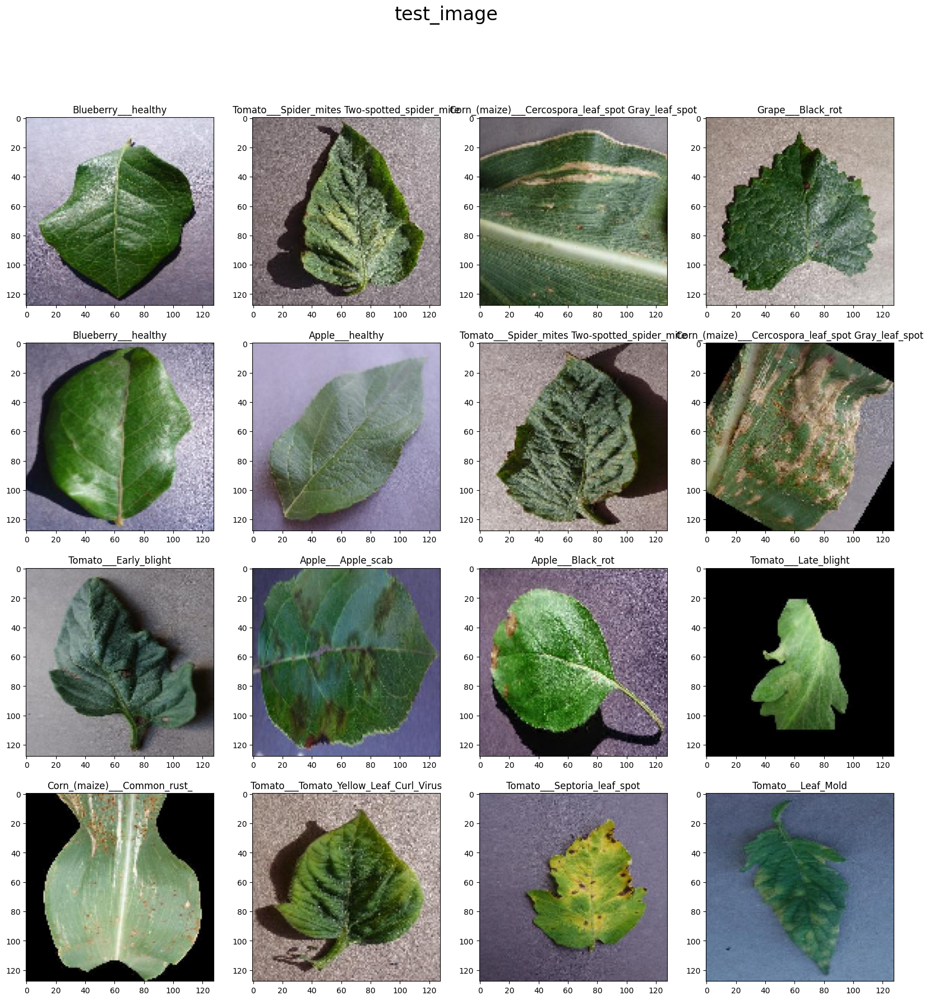

In [ ]:
show_image(test,'test_image')

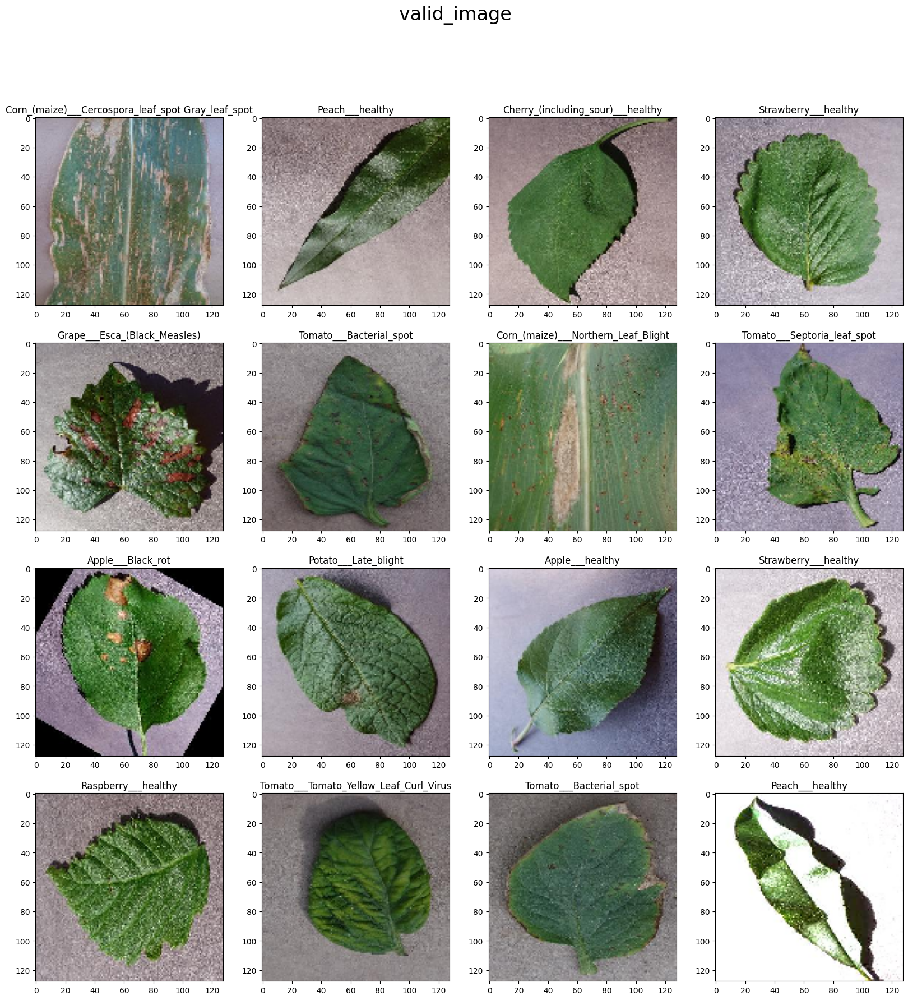

In [ ]:
show_image(valid,'valid_image')

In [ ]:
input_shape = (128,128, 3)
inputs = tensorflow.keras.Input(shape=input_shape)
print(inputs)
baseModel=tensorflow.keras.applications.InceptionV3(include_top=False,weights='imagenet',input_tensor=inputs)
baseModel.trainable=False
x=tensorflow.keras.layers.GlobalAveragePooling2D()(baseModel.output)
x=tensorflow.keras.layers.Dense(128,activation='relu')(x)
x=tensorflow.keras.layers.BatchNormalization()(x)
x=tensorflow.keras.layers.Dropout(0.5)(x)
x=tensorflow.keras.layers.Dense(64,activation='relu')(x)
x=tensorflow.keras.layers.BatchNormalization()(x)
x=tensorflow.keras.layers.Dropout(0.5)(x)
outputs=tensorflow.keras.layers.Dense(38,activation='softmax')(x)
model_InceptionV3 = tensorflow.keras.models.Model(inputs = inputs, outputs = outputs)
optimizer = tensorflow.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)
model_InceptionV3.compile(loss="categorical_crossentropy", optimizer= optimizer, metrics=["accuracy",'precision','recall'])

model_InceptionV3.summary()


<KerasTensor shape=(None, 128, 128, 3), dtype=float32, sparse=None, name=keras_tensor_892>
87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5             │ (None, 128, 128, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 63, 63, 32)     │            864 │ input_layer_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 63, 63, 32)     │             96 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 63, 63, 32)     │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 61, 61, 32)     │          9,216 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 61, 61, 32)     │             96 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 61, 61, 32)     │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 61, 61, 64)     │         18,432 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 61, 61, 64)     │            192 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 61, 61, 64)     │              0 │ batch_normalization_4… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 30, 30, 64)     │              0 │ activation_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 30, 30, 80)     │          5,120 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_5     │ (None, 30, 30, 80)     │            240 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 30, 30, 80)     │              0 │ batch_normalization_5… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 28, 28, 192)    │        138,240 │ activation_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_6     │ (None, 28, 28, 192)    │            576 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├──────────────────────

 Total params: 22,076,550 (84.22 MB)

 Trainable params: 273,382 (1.04 MB)

 Non-trainable params: 21,803,168 (83.17 MB)

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

model_checkpoint = ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True)

model_ReduceLROnPlateau = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=15, min_lr=0.000001)

callbacks=[early_stopping,model_checkpoint,model_ReduceLROnPlateau]

In [ ]:
# Training the model
history = model_InceptionV3.fit(train,
                    epochs= 10,
                    batch_size=32,
                    validation_data = valid,
                    callbacks = callbacks
                    )

Epoch 1/10
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 146s 33ms/step - accuracy: 0.3392 - loss: 2.4567 - precision: 0.6467 - recall: 0.1491 - val_accuracy: 0.7520 - val_loss: 0.8354 - val_precision: 0.8817 - val_recall: 0.6006 - learning_rate: 0.0010
Epoch 2/10
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 109s 27ms/step - accuracy: 0.5868 - loss: 1.3668 - precision: 0.7639 - recall: 0.4272 - val_accuracy: 0.7828 - val_loss: 0.7184 - val_precision: 0.8909 - val_recall: 0.6659 - learning_rate: 0.0010
Epoch 3/10
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 109s 28ms/step - accuracy: 0.6292 - loss: 1.2190 - precision: 0.7834 - recall: 0.4901 - val_accuracy: 0.7969 - val_loss: 0.6530 - val_precision: 0.8962 - val_recall: 0.7090 - learning_rate: 0.0010
Epoch 4/10
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 110s 28ms/step - accuracy: 0.6546 - loss: 1.1449 - precision: 0.7934 - recall: 0.5251 - val_accuracy: 0.7999 - val_loss: 0.6408 - val_precision: 0.8916 - val_recall: 0.7117 - learning_rate: 0.0010
Epoch 5/10
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 14

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

precision = history.history['precision']
val_precision = history.history['val_precision']

recall =history.history['recall']
val_recall =history.history['val_recall']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(loss) + 1)

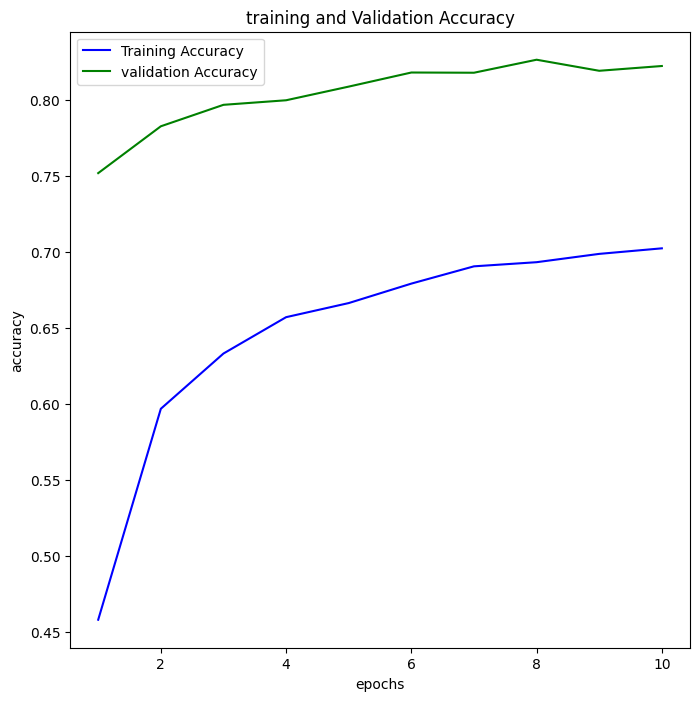

In [ ]:
plt.figure(figsize=(8,8))
plt.plot(epochs,acc,color='blue',label='Training Accuracy')
plt.plot(epochs,val_acc,color='green',label='validation Accuracy')
plt.title('training and Validation Accuracy')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

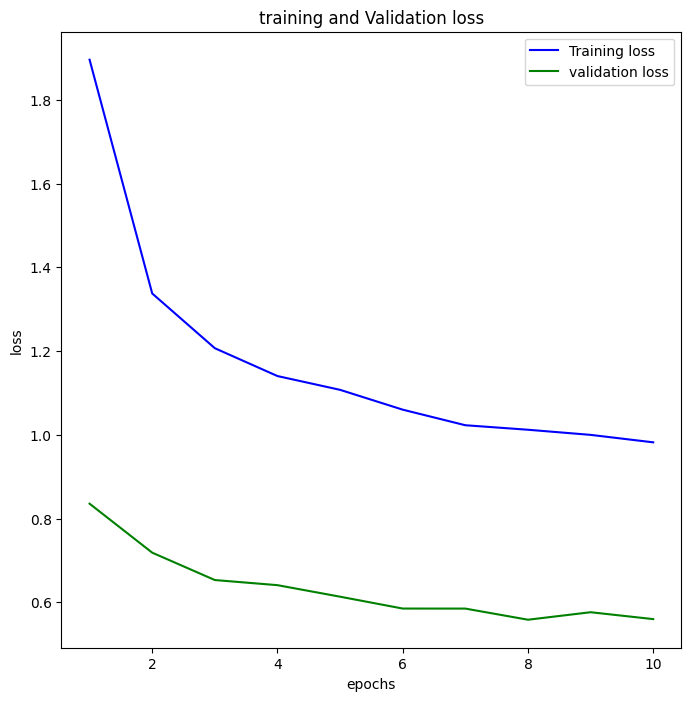

In [ ]:
plt.figure(figsize=(8,8))
plt.plot(epochs,loss,color='blue',label='Training loss')
plt.plot(epochs,val_loss,color='green',label='validation loss')
plt.title('training and Validation loss')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

In [ ]:
train_evaluate = model_InceptionV3.evaluate(train)
test_evaluate = model_InceptionV3.evaluate(test)

3956/3956 ━━━━━━━━━━━━━━━━━━━━ 98s 25ms/step - accuracy: 0.8575 - loss: 0.4609 - precision: 0.9237 - recall: 0.7922
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - accuracy: 0.8290 - loss: 0.5576 - precision: 0.9000 - recall: 0.7565


In [ ]:
results = {
    'Model': ['model_InceptionV3'],
    'Accuracy train': [train_evaluate[1]],
    'Accuracy test': [test_evaluate[1]],
    'Precision train': [train_evaluate[2]],
    'Precision test': [test_evaluate[2]],
    'Recall train': [train_evaluate[3]],
    'Recall test': [test_evaluate[3]],
}

results_df = pd.DataFrame(results)
results_df

,Model,Accuracy train,Accuracy test,Precision train,Precision test,Recall train,Recall test
0,model_InceptionV3,0.859692,0.826258,0.923887,0.899264,0.794681,0.757455


In [ ]:
results_df.to_csv('results.csv', index=False)

In [ ]:
model_InceptionV3.save('my_model.h5')

In [ ]:
from google.colab import files

# Download HDF5 file
files.download('my_model.h5')
